In [1]:
import sqlite3
import pandas as pd
import lib_v3

In [2]:
connection_sqlobject = sqlite3.connect('amazon-fine-food-reviews/database.sqlite') 
filtered_data = pd.read_sql_query(""" SELECT Id, Score, Text FROM Reviews WHERE Id > 500000 """, connection_sqlobject)

In [23]:
print(len(filtered_data))
filtered_data.head()

68454


,Id,Score,Text
0,500001,5,"I was looking for an easy and convenient way to add lean protein to my diet on my training days. A friend suggested I try these, so I did. They are really tasty! The jerky strips are really yummy as well. You will not be disappointed if you buy these. They were also much cheaper than buying at a local ""health food"" store!"
1,500002,5,"DO NOT be freaked out by the ostrich! This tastes exactly like a slim jim- it is shorter and fatter in size, but the flavor and texture are the same. You would never know you weren't eating 100% beef. Gave it to a few friends telling them it was a slim jim and they loved it. They had no idea it was anything but. I wanted a high protien snack that was not as fatty as a slim jim- they leave a gross oily residue in your mouth. This product is low fat, low carb, high in protein and tastes great (seriouly, just like a slim jim). *The Ostrim Natural has no nitrates."
2,500003,5,"I bought the Ostrim with a little apprehension never having eaten any Ostrich meat. After I had my first bite I KNEW I would be ordering more! This is one of the best beef sticks (ok beef and Ostrich) that I have tasted, not only that it is very low calorie and high protein (which helps you feel full longer) and is all natural. I'm not even half down with my first order and I already ordered a second batch. This is just really good stuff, if you like beef jerky and beef sticks try this and you'll probably like it. When you eat it the stick has a snap to it, tastes clean, not oily / greasy or fatty. You taste just meat and before you know it you've eaten the whole thing and are thing about another."
3,500004,5,"At only 80 calories these are a great bang for the ""caloric"" buck!<br />Low sugar, low fat, high protein!<br /><br />They taste like a pepperoni stick without the fat. Maybe a little on the dry side but not bad.<br /><br />I use them for protein after a workout ..."
4,500005,5,"These are quite tasty and by far the leanest, highest protein you will find. Great price as well! They are twice as big as a Slim Jim too, just WAYYYY healthier :)"


In [3]:
categories = ['Satisfied','Dissatisfied']
cat_tweets=[[],[]]
for i, row in filtered_data.iterrows():
    if row['Score'] == 1 or row['Score'] == 2:
        cat_tweets[1].append([row['Id'],'Dissatisfied',row['Text']])
    elif row['Score'] == 4 or row['Score'] == 5:
        cat_tweets[0].append([row['Id'],'Satisfied',row['Text']])

In [25]:
print(len(cat_tweets[0]))
print(len(cat_tweets[1]))

53933
9490


In [4]:
train_set = []
test_set = []
for cat in range(len(cat_tweets)):
    train_set = train_set + cat_tweets[cat][:7500]
    test_set = test_set + cat_tweets[cat][7500:9400]
    
print(len(train_set))
print(len(test_set))

15000
3800


In [27]:
train_data = lib_v3.tok(train_set)
test_data = lib_v3.tok(test_set)

In [14]:
lib_v3.show_tweets(test_data)

In [28]:
prior_probs, token_probs = lib_v3.learn_nb(train_data)
predictions = [(tweet, lib_v3.classify_nb(tweet, prior_probs, token_probs)) for tweet in test_data]
lib_v3.evaluate(predictions)

Satisfied
Precision:  90.79919408999328
Recall:  71.15789473684211
F1:  79.78754794924757

Dissatisfied
Precision:  76.28732150584163
Recall:  92.78947368421052
F1:  83.73308002849679

Average F1:  81.76031398887218


In [29]:
lib_v3.show_confusion_matrix(predictions)

,Satisfied,Dissatisfied
Satisfied,1352,548
Dissatisfied,137,1763


In [30]:
lib_v3.show_predictions(predictions)

When we try to use bigram as feature, we get lower scores for all measurements. 

In [5]:
train_data_bi = lib_v3.tokBigram(train_set)
test_data_bi = lib_v3.tokBigram(test_set)

In [7]:
prior_probs, token_probs = lib_v3.learn_nb(train_data_bi)
predictions = [(tweet, lib_v3.classify_nb(tweet, prior_probs, token_probs)) for tweet in test_data_bi]
lib_v3.evaluate(predictions)

Satisfied
Precision:  86.29792583280955
Recall:  72.26315789473684
F1:  78.65940991120023

Dissatisfied
Precision:  76.1430511543685
Recall:  88.52631578947368
F1:  81.86906789973229

Average F1:  80.26423890546626


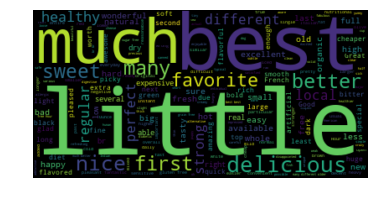

In [44]:
import nltk
from nltk.corpus import state_union
from nltk.tokenize import PunktSentenceTokenizer

Satisfy_text = " ".join(review[2] for review in train_set[:7500])
tokenizer = PunktSentenceTokenizer()
tokenized = tokenizer.tokenize(Satisfy_text)
Satisfy_adj = []

absolute_adj = ['good', 'great']

def process_content():
    try:
        for i in tokenized[:]:
            words = nltk.word_tokenize(i)
            tagged = nltk.pos_tag(words)
            for tag in tagged:
                if 'JJ' in tag[1] and tag[0] not in absolute_adj : 
                    Satisfy_adj.append(tag[0])
    except Exception as e:
        print(str(e))


process_content()


text1 = " ".join(word for word in Satisfy_adj)
Satisfy_wordcloud = WordCloud().generate(text1)
 
plt.imshow(Satisfy_wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()


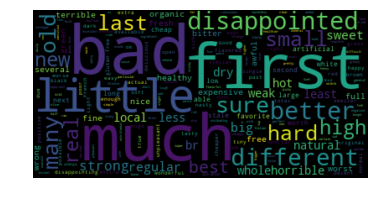

In [45]:
Dissatisfy_text = " ".join(review[2] for review in train_set[7500:])
tokenizer = PunktSentenceTokenizer()
tokenized = tokenizer.tokenize(Dissatisfy_text)
Dissatisfy_adj = []
absolute_adj = ['good', 'great']

def process_content():
    try:
        for i in tokenized[:]:
            words = nltk.word_tokenize(i)
            tagged = nltk.pos_tag(words)
            for tag in tagged:
                if 'JJ' in tag[1] and tag[0] not in absolute_adj : 
                    Dissatisfy_adj.append(tag[0])
    except Exception as e:
        print(str(e))


process_content()


text2 = " ".join(word for word in Dissatisfy_adj)
Dissatisfy_wordcloud = WordCloud().generate(text2)
 
plt.imshow(Dissatisfy_wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()